# Textual Similarity

This notebook is designed to reproduce several findings from Andrew Piper's article "Novel Devotions: Conversional Reading, Computational Modeling, and the Modern Novel" (<i>New Literary History</i> 46.1 (2015), 63-98). See especially Fig 2 (p 72), Fig 4 (p 75), and Table 1 (p 79).

Piper has made his research corpus of novels available here: https://figshare.com/articles/txtlab_Novel450/2062002

We'll download it with `wget`:

In [1]:
!wget https://ndownloader.figshare.com/files/3686778 -P data/

--2017-10-17 00:10:04--  https://ndownloader.figshare.com/files/3686778
Resolving ndownloader.figshare.com (ndownloader.figshare.com)... 52.49.71.15, 52.18.69.1
Connecting to ndownloader.figshare.com (ndownloader.figshare.com)|52.49.71.15|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://s3-eu-west-1.amazonaws.com/pfigshare-u-files/3686778/2_txtalb_Novel450.zip [following]
--2017-10-17 00:10:05--  https://s3-eu-west-1.amazonaws.com/pfigshare-u-files/3686778/2_txtalb_Novel450.zip
Resolving s3-eu-west-1.amazonaws.com (s3-eu-west-1.amazonaws.com)... 54.231.134.27
Connecting to s3-eu-west-1.amazonaws.com (s3-eu-west-1.amazonaws.com)|54.231.134.27|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 105860790 (101M) [binary/octet-stream]
Saving to: ‘data/3686778’

3686778             100%[===================>] 100.96M  20.1MB/s    in 6.6s    

2017-10-17 00:10:12 (15.2 MB/s) - ‘data/3686778’ saved [105860790/105860790]



In [2]:
%%capture
!unzip data/3686778 -d data/

## Bag of Words (BoW) language model

Today we'll see our first, admittedly primitive, computational model of language called "Bag of Words". This model was very popular in early text analysis, and continues to be used today. In fact, the models that have replaced it are still very difficult to actually interpret, giving the BoW approach a slight advantage if we want to understand why the model makes certain decisions.

Getting into the model we'll have to revisit Term Frequency (think `Counter`). We'll then see the Document-Term Matrix (DTM), which we've discusssed briefly before. We'll have to normalize these counts if we want to compare. Then we'll look at the available Python libraries to streamline this process.

Once we have our BoW model we can analyze it in a high-dimensional vector space, which gives us more insights into the similarities and clustering of different texts. We'll then get into Piper's analysis.

We'll build our model  from scratch with `numpy` and `datascience` libraries before we get into the higher level libraries:

In [2]:
%matplotlib inline
import numpy as np
from datascience import *

Let's read in Augustine's *Confessions* text:

In [3]:
with open('data/Augustine-Confessions.txt') as f:
    confessions = f.read()

confessions

'THE CONFESSIONS\nOF\n\nSAINT AUGUSTINE\n\n\nBy Saint Augustine\n\nBishop of Hippo\n\n\nTranslated by E. B. Pusey (Edward Bouverie)\n\nAD 401\n\n\nBOOK I\n\nGreat art Thou, O Lord, and greatly to be praised; great is Thy power, and Thy wisdom infinite. And Thee would man praise; man, but a particle of Thy creation; man, that bears about him his mortality, the witness of his sin, the witness that Thou resistest the proud: yet would man praise Thee; he, but a particle of Thy creation. Thou awakest us to delight in Thy praise; for Thou madest us for Thyself, and our heart is restless, until it repose in Thee. Grant me, Lord, to know and understand which is first, to call on Thee or to praise Thee? and, again, to know Thee or to call on Thee? for who can call on Thee, not knowing Thee? for he that knoweth Thee not, may call on Thee as other than Thou art. Or, is it rather, that we call on Thee that we may know Thee? but how shall they call on Him in whom they have not believed? or how shal

There should be 13 books, which are fortunately separated by six line breaks:

In [4]:
confessions_list = confessions.split('\n'*6)
len(confessions_list)

13

Let's peek at the first:

In [5]:
confessions_list[0]

'THE CONFESSIONS\nOF\n\nSAINT AUGUSTINE\n\n\nBy Saint Augustine\n\nBishop of Hippo\n\n\nTranslated by E. B. Pusey (Edward Bouverie)\n\nAD 401\n\n\nBOOK I\n\nGreat art Thou, O Lord, and greatly to be praised; great is Thy power, and Thy wisdom infinite. And Thee would man praise; man, but a particle of Thy creation; man, that bears about him his mortality, the witness of his sin, the witness that Thou resistest the proud: yet would man praise Thee; he, but a particle of Thy creation. Thou awakest us to delight in Thy praise; for Thou madest us for Thyself, and our heart is restless, until it repose in Thee. Grant me, Lord, to know and understand which is first, to call on Thee or to praise Thee? and, again, to know Thee or to call on Thee? for who can call on Thee, not knowing Thee? for he that knoweth Thee not, may call on Thee as other than Thou art. Or, is it rather, that we call on Thee that we may know Thee? but how shall they call on Him in whom they have not believed? or how shal

# Term Frequency Revisited

We'll remember from last week, that while `split` might be a quick way to get tokens, it's not the most accurate because it doesn't separate punctuation and contractions. We'll use `spacy` again to get tokens.

In [6]:
import spacy
nlp = spacy.load('en', parser=False) 



    Only loading the 'en' tokenizer.



In [7]:
first_book = confessions_list[0]
parsed = nlp(first_book)
first_token_list = [token.text for token in parsed]
first_token_list

['THE',
 'CONFESSIONS',
 '\n',
 'OF',
 '\n\n',
 'SAINT',
 'AUGUSTINE',
 '\n\n\n',
 'By',
 'Saint',
 'Augustine',
 '\n\n',
 'Bishop',
 'of',
 'Hippo',
 '\n\n\n',
 'Translated',
 'by',
 'E.',
 'B.',
 'Pusey',
 '(',
 'Edward',
 'Bouverie',
 ')',
 '\n\n',
 'AD',
 '401',
 '\n\n\n',
 'BOOK',
 'I',
 '\n\n',
 'Great',
 'art',
 'Thou',
 ',',
 'O',
 'Lord',
 ',',
 'and',
 'greatly',
 'to',
 'be',
 'praised',
 ';',
 'great',
 'is',
 'Thy',
 'power',
 ',',
 'and',
 'Thy',
 'wisdom',
 'infinite',
 '.',
 'And',
 'Thee',
 'would',
 'man',
 'praise',
 ';',
 'man',
 ',',
 'but',
 'a',
 'particle',
 'of',
 'Thy',
 'creation',
 ';',
 'man',
 ',',
 'that',
 'bears',
 'about',
 'him',
 'his',
 'mortality',
 ',',
 'the',
 'witness',
 'of',
 'his',
 'sin',
 ',',
 'the',
 'witness',
 'that',
 'Thou',
 'resistest',
 'the',
 'proud',
 ':',
 'yet',
 'would',
 'man',
 'praise',
 'Thee',
 ';',
 'he',
 ',',
 'but',
 'a',
 'particle',
 'of',
 'Thy',
 'creation',
 '.',
 'Thou',
 'awakest',
 'us',
 'to',
 'delight',
 

Now we can use `Counter` to get the term frequency:

In [8]:
from collections import Counter
word_freq = Counter(first_token_list)
word_freq.most_common(20)

[(',', 810),
 ('and', 257),
 ('I', 213),
 ('the', 209),
 ('.', 192),
 ('of', 182),
 ('to', 175),
 ('my', 160),
 (';', 128),
 ('Thou', 115),
 ('not', 110),
 ('me', 108),
 ('in', 106),
 ('Thee', 101),
 ('that', 98),
 ('?', 93),
 ('\n', 92),
 ('for', 85),
 ('a', 78),
 ('was', 69)]

## Challenge

Write some code to get the 20 most common words of the second book. How similar are they to those of the first book?

# Document-Term Matrix

If we plan to compare word frequencies across texts, we could collate these `Counter` dictionaries for each book in `Confessions`. But we don't want to write all that code! There is an easy function that streamlines the process called `CountVectorizer`. We saw it in the first notebook with Moretti, but didn't really explain what it does.

Let's look at the docstring:

In [9]:
from sklearn.feature_extraction.text import CountVectorizer
CountVectorizer?

Cool. So we'll create the `CountVectorizer` object, then transform it on our `list` of documents, here that would be the books in Augustine's `Confessions`.

In [10]:
cv = CountVectorizer()
dtm = cv.fit_transform(confessions_list)
dtm

<13x7264 sparse matrix of type '<class 'numpy.int64'>'
	with 20542 stored elements in Compressed Sparse Row format>

What's this? A sparse matrix just means that some cells in the table don't have value. Why? Because the vocabulary base is not the same for all the books! Let's try to demonstrate this.

In [11]:
# de-sparsify
desparse = dtm.toarray()

# create labels for columns
word_list = cv.get_feature_names()

# create a new Table
dtm_tb = Table(word_list).with_rows(desparse)
dtm_tb

401  | abandon | abandoned | abandonedly | abase | abased | abashed | abated | abhor | abhorred | abhorring | abide | abided | abidest | abideth | abiding | abilities | ability | abject | able | abler | abode | abolished | abominable | abound | abounded | about | above | abraham | abridged | abroad | absence | absent | absolute | absolutely | absorb | abstemious | abstinence | abstract | abstruser | absurd | absurdity | absurdly | abundance | abundant | abundantly | abuse | abyss | academicians | academics | accents | accept | acceptable | acceptably | accepted | access | accompany | accomplices | accomplish | accomplished | accord | according | account | accounted | accursed | accuse | accused | accuser | accusing | accustomed | aches | achieve | acknowledge | acknowledged | acquaintance | acquainted | acquiesce | acquire | acquired | act  | acted | acting | action | actions | actor | actors | acts | actual | actually | acute | acuteness | ad   | adam | adapt | adapted | add  | added | adding | addition | adeodatus | admirable | admiration | admire | admired | admiring | admission | admit | admitted | admittest | admonish | admonished | admonition | adopted | adoption | adored | adorned | adorning | adulterer | adulteress | adulterous | adultery | advance | advantage | adversary | adversities | adversity | advice | advices | advised | advising | aeneas | afar | affairs | affect | affected | affecting | affection | affections | affects | affianced | affirm | affirmed | affirming | affliction | afford | affright | affrighted | aforesaid | aforetime | afraid | afric | africa | african | after | afternoon | afterward | afterwards | again | against | age  | aged | agents | ages | aghast | agito | ago  | agonised | agonistic | agony | agree | agreeable | agreed | agreement | aid  | aided | ails | aim  | air  | alarmed | alas | alexandria | alike | alive | all  | allay | allaying | allege | alleging | allegorically | allegory | allotted | allow | allowances | allowed | allowing | alloy | allurements | alluring | almighty | almost | alms | almsdeeds | aloft | alone | along | aloud | already | also | altar | alteration | alterations | altered | alternately | alternates | although | altogether | always | alypius | am   | amazed | amazement | amazing | ambition | ambitions | ambitious | ambrose | ambrosian | amen | amend | amendment | amiable | amid | amidst | amiss | among | amongst | amphitheatre | ample | an   | anaximenes | ancient | and  | angel | angels | anger | angered | angers | angry | anguish | animal | animals | animate | anniversary | announce | announced | announcing | annoyance | annual | anointings | anon | another | answer | answerably | answered | answerest | answereth | answering | answers | antecedent | anticipate | anticipated | anticipating | antidote | antony | anubis | anxieties | anxiety | anxious | anxiously | any  | anything | apart | apollinarian | apostle | apostles | apostolic | apparel | apparent | apparently | appeal | appear | appearance | appeared | appeareth | appearing | appears | appetite | applauded | applauds | applauses | application | applied | apply | appointed | appointing | appointment | appointments | apportioned | apprehend | apprehended | apprehending | apprehension | approach | approached | approaching | approbation | appropriated | approve | approved | approveth | approving | apt  | aptly | aquatic | architect | architects | ardent | ardently | are  | argument | arguments | arians | aright | arise | arisen | ariseth | arising | aristotle | arithmetic | armed | armory | arms | army | arose | around | arrange | arranged | array | arrival | arrive | arrived | arriving | arrogancy | arrogant | arrows | art  | artifice | artificer | artifices | arts | as   | ascend | ascended | ascending | ascension | ascertained | ascribe | ascribed | ashamed | ashes | aside | ask  | asked | asketh | asking | asks | asleep | aspirate | assail | assailed | assaying | assembly | assent | assented | assenting | 

Welcome to the ***Document Term Matrix***. This is a core concept in NLP and text analysis. It's not that complicated!

We have columns for each word *in the entire corpus*. Then each *row* is for each *document*. In our case, that's books in *Confessions*. The values are the word count for that word in the corresponding document. Note that there are many 0s, that word just doesn't show up in that document!

We can call up frequencies for a given word for each chapter easily, since they are the column names:

In [12]:
dtm_tb['read']

array([ 6,  0,  1,  3,  7,  4,  8, 18, 10,  1,  0,  3,  5], dtype=int64)

Looks to be about 13 counts, one for each book, let's double check!

In [13]:
len(dtm_tb['read'])

13

# Normalization

Piper notes:

> The words were thus normalized according to their relative importance within the work. [95]

Let's get the total number of occurences of each word in the whole text. The key to the code below is `sum(desparse)`, which sums the column for all the books in our matrix:

In [14]:
toks_tab = Table()
toks_tab.append_column(label="Word List", values=word_list)
toks_tab.append_column(label="Frequency", values=sum(desparse))  # this sum(desparse) will sum the word count column
toks_tab.show()

Word List,Frequency
401,1
abandon,3
abandoned,3
abandonedly,1
abase,1
abased,1
abashed,1
abated,1
abhor,2
abhorred,1


Cool, but we already know how to do this much faster with `Counter`. Let's take this another step further. In order to make apples-to-apples comparisons across Books, we can normalize our values by dividing each word count by the total number of words in its Book. To do that, we'll need to `sum` on `axis=1`, which means summing the row (number of words in that book), as opposed to summing the column.

Once we have the total number of words in that Book, we can get the percentage of words that one particular word accounts for, and we can do that for every word across the matrix!

In [15]:
row_sums = np.sum(desparse, axis=1)
normed = desparse/row_sums[:,None]
dtm_tb = Table(word_list).with_rows(normed)
dtm_tb

401         | abandon     | abandoned   | abandonedly | abase      | abased | abashed     | abated     | abhor       | abhorred    | abhorring   | abide       | abided | abidest     | abideth     | abiding     | abilities   | ability     | abject      | able        | abler       | abode       | abolished   | abominable | abound      | abounded    | about       | above       | abraham     | abridged | abroad      | absence     | absent      | absolute | absolutely  | absorb      | abstemious  | abstinence  | abstract    | abstruser   | absurd      | absurdity | absurdly | abundance   | abundant    | abundantly  | abuse       | abyss       | academicians | academics   | accents     | accept      | acceptable  | acceptably  | accepted    | access      | accompany   | accomplices | accomplish  | accomplished | accord      | according   | account     | accounted   | accursed    | accuse      | accused     | accuser     | accusing    | accustomed  | aches       | achieve | acknowledge | acknowledged | acquaintance | acquainted  | acquiesce   | acquire     | acquired    | act         | acted       | acting     | action      | actions     | actor       | actors      | acts        | actual      | actually    | acute       | acuteness   | ad          | adam        | adapt | adapted    | add         | added       | adding      | addition    | adeodatus   | admirable   | admiration  | admire      | admired     | admiring    | admission   | admit       | admitted    | admittest   | admonish    | admonished | admonition  | adopted     | adoption | adored      | adorned     | adorning | adulterer   | adulteress  | adulterous  | adultery    | advance     | advantage   | adversary   | adversities | adversity   | advice      | advices     | advised     | advising    | aeneas      | afar        | affairs     | affect      | affected    | affecting | affection   | affections  | affects     | affianced   | affirm      | affirmed    | affirming  | affliction | afford | affright | affrighted  | aforesaid | aforetime   | afraid      | afric       | africa      | african     | after       | afternoon   | afterward   | afterwards  | again       | against     | age         | aged        | agents      | ages        | aghast      | agito       | ago         | agonised    | agonistic   | agony       | agree       | agreeable   | agreed      | agreement   | aid         | aided      | ails        | aim         | air         | alarmed     | alas        | alexandria  | alike       | alive       | all        | allay       | allaying    | allege      | alleging    | allegorically | allegory | allotted    | allow       | allowances | allowed     | allowing | alloy      | allurements | alluring    | almighty    | almost      | alms | almsdeeds   | aloft       | alone       | along       | aloud       | already     | also       | altar       | alteration | alterations | altered     | alternately | alternates | although    | altogether  | always      | alypius     | am          | amazed      | amazement   | amazing | ambition    | ambitions   | ambitious   | ambrose     | ambrosian   | amen | amend       | amendment   | amiable     | amid        | amidst     | amiss | among       | amongst     | amphitheatre | ample       | an          | anaximenes  | ancient     | and       | angel       | angels      | anger       | angered     | angers     | angry       | anguish     | animal      | animals     | animate     | anniversary | announce | announced   | announcing | annoyance   | annual      | anointings | anon        | another     | answer      | answerably  | answered    | answerest   | answereth | answering   | answers     | antecedent | anticipate  | anticipated | anticipating | antidote    | antony      | anubis      | anxieties   | anxiety     | anxious     | anxiously   | any         | anything    | apart       | apollinarian | apostle     | apostles    | apostolic  | apparel     | apparent    | apparently | appeal      | appear      | appearance  | appeared   

Reading the matrix above, we see that the word "abandoned" accounts for .0145406% of words in Book 1, and .0277855% of words in Book 2.

We can still grab out the normalized frequencies of the word 'read' for each book:

In [16]:
dtm_tb['abandoned']

array([ 0.00014741,  0.00027785,  0.        ,  0.        ,  0.00015542,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ])

For a variety of reasons we like to remove words like "the", "of", "and", etc. These are refered to as 'stopwords.' As Piper notes in footnote 24:

> I removed stop words and only kept those words that appeared in at least sixty percent
of the documents (twelve of the twenty parts). [95]

In [17]:
from sklearn.feature_extraction.stop_words import ENGLISH_STOP_WORDS
ENGLISH_STOP_WORDS

frozenset({'a',
           'about',
           'above',
           'across',
           'after',
           'afterwards',
           'again',
           'against',
           'all',
           'almost',
           'alone',
           'along',
           'already',
           'also',
           'although',
           'always',
           'am',
           'among',
           'amongst',
           'amoungst',
           'amount',
           'an',
           'and',
           'another',
           'any',
           'anyhow',
           'anyone',
           'anything',
           'anyway',
           'anywhere',
           'are',
           'around',
           'as',
           'at',
           'back',
           'be',
           'became',
           'because',
           'become',
           'becomes',
           'becoming',
           'been',
           'before',
           'beforehand',
           'behind',
           'being',
           'below',
           'beside',
           'besides'

Since we are using an older translation of Augustine, we have to remove archaic forms of these stopwords as well.

In [18]:
ye_olde_stop_words = ['thou','thy','thee', 'thine', 'ye', 'hath','hast', 'wilt','aught',\
                      'art', 'dost','doth', 'shall', 'shalt','tis','canst','thyself',\
                     'didst', 'yea', 'wert']

stop_words = list(ENGLISH_STOP_WORDS) + ye_olde_stop_words

# remove stopwords from column list
dtm_tb = dtm_tb.drop(stop_words)

# it is often more efficient to perform operations on arrays rather than tables
dtm_array = dtm_tb.to_array()
dtm_array

array([ ( 0.00014741,  0.        ,  0.00014741,   0.00000000e+00,  0.        ,   0.00000000e+00,  0.00014741,  0.        ,  0.        ,  0.       ,  0.        ,   4.42216981e-04,  0.        ,   0.00000000e+00,   0.00000000e+00,  0.        ,   0.00000000e+00,   0.00000000e+00,  0.        ,  0.00014741,  0.        ,   0.00000000e+00,  0.        ,  0.       ,  0.        ,  0.00014741,  0.        ,  0.        ,  0.        ,   0.00000000e+00,  0.        ,  0.        ,  0.        ,  0.        ,  0.        ,   0.00000000e+00,  0.        ,  0.        ,   0.00000000e+00,  0.        ,  0.        ,  0.00014741,   0.00000000e+00,  0.        ,  0.        ,   1.47405660e-04,  0.        ,  0.        ,  0.00014741,  0.        ,   0.00000000e+00,  0.        ,  0.        ,  0.        ,   0.00000000e+00,  0.        ,  0.        ,  0.        ,  0.        ,  0.00029481,   0.00000000e+00,   0.00000000e+00,  0.        ,  0.        ,  0.        ,  0.        ,  0.        ,  0.        ,   0.00000000e+00,  0.   

## Question

In the script above, we normalized term frequencies before removing stopwords. However, it would have been just as easy to do those steps in the opposite order. Are there situations where this decision has more or less of an impact on the output?

Note: Generally stopwords are removed [*before*](https://github.com/scikit-learn/scikit-learn/blob/ef5cb84a/sklearn/feature_extraction/text.py#L605) counting term frequencies and normalization.

# Streamlining

That was a lot of work, if this is such a common task hasn't someone streamlined this? In fact, we can simply instruct `CountVectorizer` not to include stopwords at all and another function, `TfidfTransformer`, normalizes easily.

In [19]:
from sklearn.feature_extraction.text import TfidfTransformer

cv = CountVectorizer(stop_words = stop_words)
dtm = cv.fit_transform(confessions_list)
tt = TfidfTransformer(norm='l1',use_idf=False)
dtm_tf = tt.fit_transform(dtm)

word_list = cv.get_feature_names()
dtm_array = dtm_tf.toarray()

> Note: If you are processing a text that uses only contemporary English, it may be unnecessary to import the list of stopwords explicitly. Simply pass the value `"english"` into the `"stop_words"` argument in `CountVectorizer`.

In [20]:
Table(word_list).with_rows(dtm_array)

401         | abandon    | abandoned   | abandonedly | abase       | abased | abashed     | abated      | abhor       | abhorred    | abhorring   | abide       | abided | abidest     | abideth     | abiding     | abilities   | ability     | abject      | able        | abler       | abode       | abolished   | abominable  | abound      | abounded    | abraham     | abridged | abroad      | absence     | absent      | absolute | absolutely  | absorb      | abstemious  | abstinence  | abstract    | abstruser   | absurd      | absurdity | absurdly | abundance   | abundant    | abundantly  | abuse       | abyss       | academicians | academics   | accents     | accept      | acceptable  | acceptably  | accepted    | access      | accompany   | accomplices | accomplish  | accomplished | accord      | according   | account     | accounted   | accursed    | accuse      | accused     | accuser     | accusing    | accustomed  | aches       | achieve | acknowledge | acknowledged | acquaintance | acquainted  | acquiesce   | acquire     | acquired    | act         | acted       | acting      | action      | actions     | actor       | actors      | acts        | actual      | actually    | acute       | acuteness   | ad          | adam        | adapt | adapted     | add         | added       | adding      | addition    | adeodatus   | admirable   | admiration  | admire      | admired     | admiring    | admission   | admit       | admitted    | admittest   | admonish    | admonished  | admonition  | adopted     | adoption | adored      | adorned     | adorning | adulterer   | adulteress  | adulterous  | adultery    | advance     | advantage   | adversary   | adversities | adversity   | advice      | advices     | advised     | advising    | aeneas     | afar        | affairs     | affect      | affected    | affecting | affection   | affections  | affects     | affianced   | affirm      | affirmed    | affirming   | affliction | afford | affright | affrighted  | aforesaid | aforetime   | afraid      | afric       | africa      | african     | afternoon   | afterward   | age         | aged       | agents      | ages        | aghast      | agito       | ago         | agonised    | agonistic   | agony       | agree       | agreeable   | agreed      | agreement   | aid         | aided       | ails        | aim         | air         | alarmed     | alas        | alexandria  | alike       | alive       | allay       | allaying    | allege      | alleging    | allegorically | allegory | allotted    | allow       | allowances  | allowed     | allowing | alloy      | allurements | alluring    | almighty    | alms | almsdeeds   | aloft       | aloud       | altar       | alteration | alterations | altered     | alternately | alternates | altogether  | alypius     | amazed      | amazement   | amazing | ambition    | ambitions   | ambitious   | ambrose     | ambrosian   | amen | amend       | amendment   | amiable     | amid        | amidst      | amiss | amphitheatre | ample       | anaximenes  | ancient     | angel       | angels      | anger       | angered     | angers      | angry       | anguish     | animal      | animals     | animate     | anniversary | announce | announced   | announcing | annoyance   | annual      | anointings  | anon        | answer      | answerably  | answered    | answerest   | answereth | answering   | answers     | antecedent | anticipate  | anticipated | anticipating | antidote    | antony     | anubis      | anxieties   | anxiety     | anxious     | anxiously   | apart       | apollinarian | apostle     | apostles    | apostolic   | apparel     | apparent    | apparently | appeal      | appear      | appearance  | appeared    | appeareth   | appearing   | appears     | appetite    | applauded   | applauds    | applauses   | application | applied     | apply | appointed   | appointing  | appointment | appointments | apportioned | apprehend   | apprehended | apprehending | apprehension | approach    | approached  | a

# Vector Space Model of Language

>  My question was: how does a vocabulary
that runs throughout the majority of a work change over the course of that work? I then
calculated the Euclidean distance between each of the twenty parts of the work based on
the frequency of the remaining words and stored those results in a symmetrical distance
table. [95]

Great, now we have a matrix with normalized frequencies of all the words ***in the entire corpus***. Right now our corpus is just all the books in Augustine's *Confessions*.

Let's move away from the table and just create a list of 13 vectors with only the normalized frequency values, one for each Book.

In [21]:
dtm_array = dtm_tf.toarray()
dtm_array

array([[ 0.00040717,  0.        ,  0.00040717, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.00074294, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ..., 
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.00028662],
       [ 0.        ,  0.        ,  0.        , ...,  0.00044072,
         0.        ,  0.        ]])

Each vector has a number of coordinates equal to the number of unique words in the corpus. Let's just take Book 1:

In [22]:
dtm_array[0]

array([ 0.00040717,  0.        ,  0.00040717, ...,  0.        ,
        0.        ,  0.        ])

One way to measure the similarity of texts, which Piper uses in his article, would be to measure the *Euclidean distance* between their coordinates in space. According to Wikipedia:

>The Euclidean distance or Euclidean metric is the "ordinary" straight-line distance between two points in Euclidean space

>$\mathrm{d}(\mathbf{b},\mathbf{a})=\sqrt{(a_1-b_1)^2 + (a_2-b_2)^2}$

Let's consider a simple 2 dimensional model. We have two point in space:

In [23]:
a = (2,6)
b = (5,10)

euc_dist = np.sqrt( (a[0]-b[0])**2  +  (a[1]-b[1])**2 )
euc_dist

5.0

We can visualize this too:

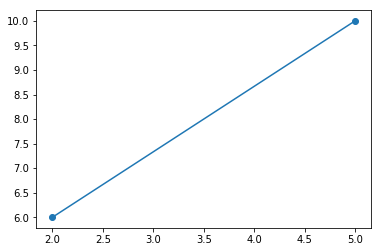

In [24]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.scatter([a[0], b[0]], [a[1], b[1]])
plt.plot([a[0], b[0]], [a[1], b[1]])
plt.show()

We can think of this 2 dimensional distance between 2 points as looking at 2 different texts. In this *very* simple 2-d model though, we only have 2 words in the entire corpus! `(2,6)` and `(5,10)` would be the absolute counts for each text. Imagine:

```
Document 1:

the dog the dog dog dog dog dog

Document 2:

the dog the dog the dog the dog the dog dog dog dog dog dog

```

That would yield the comparison above. If we added a third point (document), we could see which 2 documents were closest to one another!

---

Ok, not too bad, but how do we do this with hundreds or thousands of dimensions (words) acorss hundreds or thousands of points (documents)? Well it actually scales the same way! Here it is for 3 dimensions:

$\mathrm{d}(\mathbf{b},\mathbf{a})=\sqrt{(a_1-b_1)^2 + (a_2-b_2)^2 + (a_3-b_3)^2}$

In [25]:
a = (2,6,15)
b = (5,10,3)

euc_dist = np.sqrt( (a[0]-b[0])**2 +  (a[1]-b[1])**2 + (a[2]-b[2])**2 )
euc_dist

13.0

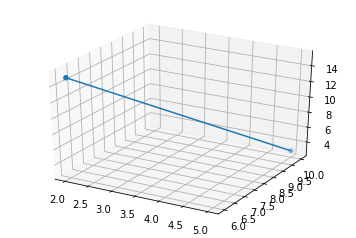

In [26]:
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D

mpl.rcParams['legend.fontsize'] = 10

fig = plt.figure()
ax = fig.gca(projection='3d')
ax.scatter([a[0], b[0]], [a[1], b[1]], [a[2], b[2]])
ax.plot([a[0], b[0]], [a[1], b[1]], [a[2], b[2]])
plt.show()

We don't have to use our cool formula to calculate this, or to scale it up for *n* dimensions. That's what `scipy` is for:

In [27]:
from scipy.spatial import distance
distance.euclidean(a,b)

13.0

---

Another measure of two vectors, more common for text analysis, is called *cosine similarity*. According to Wikipedia:

>Cosine similarity is a measure of similarity between two non-zero vectors of an inner product space that measures the cosine of the angle between them. The cosine of 0° is 1, and it is less than 1 for any other angle. It is thus a judgment of orientation and not magnitude: two vectors with the same orientation have a cosine similarity of 1, two vectors at 90° have a similarity of 0, and two vectors diametrically opposed have a similarity of -1, independent of their magnitude.

>$\text{similarity} = \cos(\theta) = {\mathbf{A} \cdot \mathbf{B} \over \|\mathbf{A}\|_2 \|\mathbf{B}\|_2} = \frac{ \sum\limits_{i=1}^{n}{A_i  B_i} }{ \sqrt{\sum\limits_{i=1}^{n}{A_i^2}}  \sqrt{\sum\limits_{i=1}^{n}{B_i^2}} }$

Essentially we want to take the cosine of the angle formed between two vectors (documents). We start the vector at the origin and measure the angle between the two vectors we're interested in.

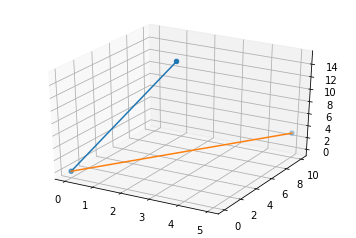

In [28]:
mpl.rcParams['legend.fontsize'] = 10

origin = (0,0,0)

fig = plt.figure()
ax = fig.gca(projection='3d')
ax.scatter([a[0], b[0], origin[0]], [a[1], b[1], origin[1]], [a[2], b[2], origin[2]])
ax.plot([origin[0], a[0]], [origin[1], a[1]], [origin[2], a[2]])
ax.plot([origin[0], b[0]], [origin[1], b[1]], [origin[2], b[2]])
plt.show()

Let's go back to two dimensions for the vanilla `numpy` calculation:

In [29]:
a = (2,6)
b = (5,10)

# don't worry about the formula so much as the intuition behind it: angle between vectors
cos_dist = 1 - (a[0]*b[0] + a[1]*b[1]) / ( np.sqrt(a[0]**2 + a[1]**2 ) * np.sqrt(b[0]**2 + b[1]**2 ) )
cos_dist

0.010050506338833531

Of course, `scipy` has taken care of this for us too:

In [30]:
distance.cosine(a,b)

0.010050506338833531

For the 3-d model:

In [31]:
a = (2,6,15)
b = (5,10,3)
distance.cosine(a,b)

0.38972932126508741

## Challenge

Try passing different values into both the euclidean and cosine distance functions. What is your intuition about these different measurements? Remember that all values in the Term-Frequency Matrix are positive, between [0,1], and that most are very small.

# Visualizing Texts in Vector Space

Let's walk through this now. Say we have 3 texts, `a`, `b`, and `c`. The whole corpus, again, only has 2 words (dimensions)!

In [32]:
a = (2,6)
b = (5,10)
c = (14,11)

print(distance.euclidean(a,b))
print(distance.euclidean(a,c))
print(distance.euclidean(b,c))

5.0
13.0
9.05538513814


We'll make a matrix for the points:

In [33]:
point_matrix = np.array([a,b,c])
point_matrix

array([[ 2,  6],
       [ 5, 10],
       [14, 11]])

Now we can use `sklearn`'s `pairwise_distances` method to compare each book to each book:

In [34]:
from sklearn.metrics import pairwise
pairwise.pairwise_distances(point_matrix, metric='euclidean')

array([[  0.        ,   5.        ,  13.        ],
       [  5.        ,   0.        ,   9.05538514],
       [ 13.        ,   9.05538514,   0.        ]])

Cool! We got what we calculated. Note: the results are mirrored because the columns and rows are both the same texts.

We can do the same thing on Augustine's *Confessions*, remember the rows are for each Book too!:

In [35]:
dist_matrix = pairwise.pairwise_distances(dtm_tf, metric='euclidean')

title_list = ['Book '+str(i+1) for i in range(len(confessions_list))]
Table(title_list).with_rows(dist_matrix)

Book 1,Book 2,Book 3,Book 4,Book 5,Book 6,Book 7,Book 8,Book 9,Book 10,Book 11,Book 12,Book 13
0,0.0426155,0.0421469,0.040844,0.0417097,0.0429122,0.04342,0.0398748,0.0383303,0.0442169,0.0776123,0.0636436,0.0482762
0.0426155,0,0.0432209,0.040206,0.0427995,0.0431114,0.0469899,0.0425239,0.0416752,0.0471316,0.0815088,0.0708269,0.0545424
0.0421469,0.0432209,0,0.0385689,0.0392525,0.0385987,0.0428515,0.039538,0.0404757,0.0445672,0.0785294,0.0668597,0.0518121
0.040844,0.040206,0.0385689,0,0.0376301,0.0372361,0.039982,0.0386109,0.0384827,0.0417625,0.0780089,0.0662575,0.047854
0.0417097,0.0427995,0.0392525,0.0376301,0,0.0349408,0.0368119,0.03665,0.0361993,0.0435885,0.0751002,0.0647023,0.0494177
0.0429122,0.0431114,0.0385987,0.0372361,0.0349408,0,0.0428654,0.0336348,0.0341594,0.0421755,0.0765217,0.068785,0.0502477
0.04342,0.0469899,0.0428515,0.039982,0.0368119,0.0428654,0,0.040501,0.0428643,0.045794,0.0770907,0.0618563,0.0459906
0.0398748,0.0425239,0.039538,0.0386109,0.03665,0.0336348,0.040501,0,0.0319995,0.0422529,0.0768623,0.0663905,0.0473318
0.0383303,0.0416752,0.0404757,0.0384827,0.0361993,0.0341594,0.0428643,0.0319995,0,0.0421746,0.0739035,0.0659483,0.0453043
0.0442169,0.0471316,0.0445672,0.0417625,0.0435885,0.0421755,0.045794,0.0422529,0.0421746,0,0.0736634,0.0678287,0.0502188


Visualizing hundreds of dimensions is difficult for us. So we can use multi-dimensional scaling (MDS) to put this into a 2-d graph for us:

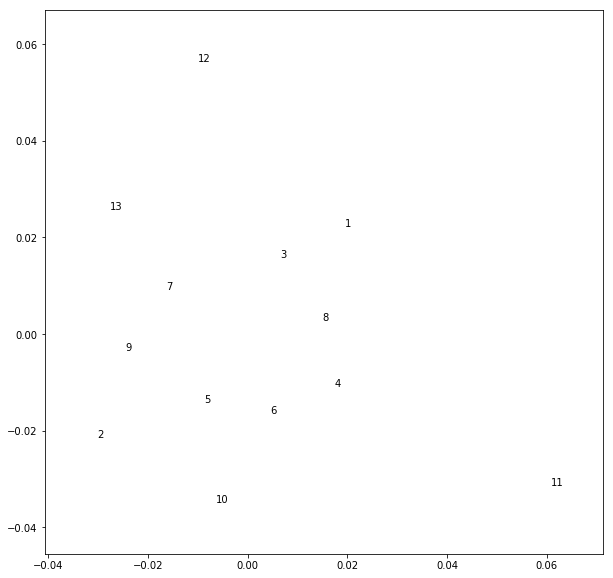

In [36]:
from sklearn.manifold import MDS

mds = MDS(n_components = 2, dissimilarity="precomputed")
embeddings = mds.fit_transform(dist_matrix)

_, ax = plt.subplots(figsize=(10,10))
ax.scatter(embeddings[:,0], embeddings[:,1], alpha=0)
for i in range(13):
    ax.annotate(i+1, ((embeddings[i,0], embeddings[i,1])))

## Homework

Try visualizing the textual similarities again using the Cosine distance. How does that change the result? Why?

# Brief Aside: K-Means Clustering

Tries to find natural groupings among points, once we tell it how many groups to look for.

In [37]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=2)
kmeans.fit_predict(dist_matrix)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0], dtype=int32)

> A standard clustering test such as k-means indicates that the two clusters consist of Books 11–12, with Book 13 being grouped with Books 1–10.) [71]

This array (length 13) classifies each book into the `n_clusters` we decide based on their vector similarities. We won't do much more clustering, but just know that it's an ***unsupervised*** machine learning algorithm to classify data. We have to choose how many classes (categories) there are, and the algorithm will decide in which bucket to place the observation.

---

# The Conversional Novel

> The first step was to divide each novel into twenty equal parts. Rather than rely on the
irregularity of chapter divisions, which can vary within and between works, this process creates
standard units of analysis. [95]

Instead of actually using chapter divisions, Piper elects to split each novel into 20 equal parts. We can write a function `text_splitter` that will take in a `str` of the text and return a list of 20 equal parts:

In [38]:
def text_splitter(text):
    n = int(len(text)/20)  # get length n of each part
    text_list = [text[i*n:(i+1)*n] for i in range(20)]  # slice out the text
    return(text_list)

> I then
calculated the Euclidean distance between each of the twenty parts of the work based on
the frequency of the remaining words and stored those results in a symmetrical distance
table. In the end, for each work I had a 20x20 table of distances between every part of
a work to every other, in which the distances are considered to be measures of the similarity
of the language between a work’s individual parts. [95]

Piper then calculates the ***Euclidean*** distances between each part to every other part. So we'll have to calculate the distance and use our `pairwise` method. We can write a function for that too! To make it better, let's have it take in a list of texts that our `text_splitter` will output:

In [93]:
def text_distances(text_list):
    
    from sklearn.feature_extraction.stop_words import ENGLISH_STOP_WORDS
    from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
    from sklearn.metrics import pairwise
    
    ye_olde_stop_words = ['thou','thy','thee', 'thine', 'ye', 'hath','hast', 'wilt','aught',\
                          'art', 'dost','doth', 'shall', 'shalt','tis','canst','thyself',\
                         'didst', 'yea', 'wert']
    stop_words = list(ENGLISH_STOP_WORDS)+ye_olde_stop_words
    cv = CountVectorizer(stop_words = stop_words)
    dtm = cv.fit_transform(text_list)
    tt = TfidfTransformer(norm='l1',use_idf=False)
    dtm_tf = tt.fit_transform(dtm)
    dist_matrix = pairwise.pairwise_distances(dtm_tf, metric='euclidean')
    return(dist_matrix)

Piper the introduces two new ideas.

> for the ***in-half distance*** I took the average distance of each part in the first half of a work to every other part in that half and subtracted it from the average distance of every part of the second half to itself. [95]

Let's write a function that does that, and have it take in our matrix returned by `text_distances`:

In [94]:
def in_half_dist(matrix):
    n = len(matrix)  # length of work, should be 20
    d1 = []  # will hold distances for first half
    d2 = []  # will hold distances for second half
    for i in range(int(n/2)-1):  # loop through first half of work (10 in our case)
        for j in range(i+1, int(n/2)):  # loop through itself (first half again)
            d1.append(matrix[i,j])  # append distance between one part to another (in first half)
    for i in range(int(n/2), n-1):
        for j in range(i+1, n):
            d2.append(matrix[i,j])
    return(abs(sum(d1)-sum(d2))/len(d1))  # take average of each distance array and subtract 2 from 1

Great! And now for his second measure:

> For the cross-half distance, I took the average distance between
all of the first ten parts of a work to all of the second ten parts of a work, similar to the
process used in group average clustering. [95]

Let's write another function:

In [95]:
def cross_half_dist(matrix):
    n = len(matrix)  # number of parts, here 20
    d = []  # will hold distnaces
    for i in range(int(n/2)):  # loop through first half
        for j in range(int(n/2), n):  # loop through second half
            d.append(matrix[i,j])  # append distance between first and second
    return(sum(d)/len(d))  # take average

Awesome! We can also write ourselves a quick function to call the four functions we just wrote:

In [96]:
def text_measures(text):
    text_list = text_splitter(text)
    dist_matrix = text_distances(text_list)
    return(cross_half_dist(dist_matrix), in_half_dist(dist_matrix))

`text_measures` should now return two values. The first values is the `cross_half_dist` and the second values is the `in_half_dist`. Let's test this out on Augustine's `Confessions':

In [97]:
text_measures(confessions)

(0.061499461794630672, 0.026658085811939364)

Looks good! Now we can read in the corpus Piper used:

In [98]:
metadata_tb = Table.read_table('data/2_txtlab_Novel450.csv')
metadata_tb.show(5)

filename,id,language,date,author,title,gender,person,length
"DE_1771_La Roche,Sophievon_GeschichtedesFräuleinsvonSte ...",1,German,1771,"La Roche,Sophievon",GeschichtedesFräuleinsvonSternheim,female,first,99070
"DE_1774_Goethe,Johann_DieLeidendesjungenWerthers1_Novel.txt",2,German,1774,"Goethe,Johann",DieLeidendesjungenWerthers1,male,first,34976
"DE_1774_Wieland,ChristophMartin_GeschichtederAbderiten_N ...",3,German,1774,"Wieland,ChristophMartin",GeschichtederAbderiten,male,first,107398
"DE_1776_Nicolai,Friedrich_SebaldusNothanker_Novel.txt",4,German,1776,"Nicolai,Friedrich",SebaldusNothanker,male,third,122673
"DE_1779_Campe,Joachim_Robinson_Novel.txt",5,German,1779,"Campe,Joachim",Robinson,male,third,99439


We'll stick with English so we don't have to think about the possible issues of going between languages:

In [99]:
metadata_tb = metadata_tb.where('language', "English")
metadata_tb.show(5)

filename,id,language,date,author,title,gender,person,length
"EN_1771_Mackenzie,Henry_TheManofFeeling_Novel.txt",151,English,1771,"Mackenzie,Henry",TheManofFeeling,male,first,36458
"EN_1771_Smollett,Tobias_TheExpedictionofHenryClinker_Nov ...",152,English,1771,"Smollett,Tobias",TheExpedictionofHenryClinker,male,first,148261
"EN_1778_Burney,Fanny_Evelina_Novel.txt",153,English,1778,"Burney,Fanny",Evelina,female,first,154168
"EN_1782_Burney,Fanny_Cecilia_Novel.txt",154,English,1782,"Burney,Fanny",Cecilia,female,third,328981
"EN_1786_Beckford,William_Vathek_Novel.txt",155,English,1786,"Beckford,William",Vathek,male,third,36077


We'll slightly change our `text_measures` function so that it can read in the file of the text we want to read in, instead of taking the `confessions` string we already had:

In [100]:
corpus_path = 'data/2_txtalb_Novel450/'

def text_measures_alt(text_name):
    with open(corpus_path+text_name, 'r') as file_in:
        text = file_in.read()
    text_list = text_splitter(text)
    dist_matrix = text_distances(text_list)
    return(cross_half_dist(dist_matrix), in_half_dist(dist_matrix))

Now we can use `Table`'s `apply` method to call the function `text_measures_alt` on all the files in the corpus:

In [101]:
measures = metadata_tb.apply(text_measures_alt, 'filename')
measures

array([[  6.34283102e-02,   5.53108034e-03],
       [  3.28754917e-02,   5.17329076e-04],
       [  4.67628706e-02,   1.97548307e-04],
       [  3.32778406e-02,   2.33691650e-03],
       [  5.72729927e-02,   7.62854106e-05],
       [  6.86623649e-02,   1.44784149e-04],
       [  5.00924687e-02,   2.79742810e-06],
       [  4.10322527e-02,   1.64017294e-03],
       [  3.90831018e-02,   5.71731304e-03],
       [  6.21957333e-02,   1.31686296e-04],
       [  3.92033850e-02,   1.62578705e-03],
       [  4.20291811e-02,   1.27861292e-03],
       [  2.98362362e-02,   2.51142562e-03],
       [  4.46547143e-02,   1.48168936e-04],
       [  5.10345791e-02,   3.61038095e-03],
       [  4.12880614e-02,   8.89077747e-04],
       [  5.37254431e-02,   6.13391609e-04],
       [  3.46621331e-02,   2.99103209e-03],
       [  7.91709678e-02,   1.01881466e-02],
       [  4.73038786e-02,   4.15529855e-03],
       [  5.39129542e-02,   7.11014376e-03],
       [  7.28904575e-02,   4.64691279e-04],
       [  

Let's add these measures to our `Table`:

In [102]:
metadata_tb['Cross-Half'] = measures[:,0]
metadata_tb['In-Half'] = measures[:,1]
metadata_tb.show(5)

filename,id,language,date,author,title,gender,person,length,Cross-Half,In-Half
"EN_1771_Mackenzie,Henry_TheManofFeeling_Novel.txt",151,English,1771,"Mackenzie,Henry",TheManofFeeling,male,first,36458,0.0634283,0.00553108
"EN_1771_Smollett,Tobias_TheExpedictionofHenryClinker_Nov ...",152,English,1771,"Smollett,Tobias",TheExpedictionofHenryClinker,male,first,148261,0.0328755,0.000517329
"EN_1778_Burney,Fanny_Evelina_Novel.txt",153,English,1778,"Burney,Fanny",Evelina,female,first,154168,0.0467629,0.000197548
"EN_1782_Burney,Fanny_Cecilia_Novel.txt",154,English,1782,"Burney,Fanny",Cecilia,female,third,328981,0.0332778,0.00233692
"EN_1786_Beckford,William_Vathek_Novel.txt",155,English,1786,"Beckford,William",Vathek,male,third,36077,0.057273,7.62854e-05


If we want to see which novels stick out, we might be interested in the z-score for a particular novel. This is how many standard devations the novel is away from the mean. Let's write a function:

In [103]:
def get_zscores(values):

    import numpy as np
    mn = np.mean(values)
    st = np.std(values)
    zs = []
    
    for x in values:
        z = (x-mn)/st
        zs.append(z)

    return zs

Now we can add these to the `Table` too:

In [104]:
metadata_tb['Cross-Z-Score'] = get_zscores(measures[:,0])
metadata_tb['In-Z-Score'] = get_zscores(measures[:,1])
metadata_tb.show(5)

filename,id,language,date,author,title,gender,person,length,Cross-Half,In-Half,Cross-Z-Score,In-Z-Score
"EN_1771_Mackenzie,Henry_TheManofFeeling_Novel.txt",151,English,1771,"Mackenzie,Henry",TheManofFeeling,male,first,36458,0.0634283,0.00553108,1.01315,1.16239
"EN_1771_Smollett,Tobias_TheExpedictionofHenryClinker_Nov ...",152,English,1771,"Smollett,Tobias",TheExpedictionofHenryClinker,male,first,148261,0.0328755,0.000517329,-1.03057,-0.815702
"EN_1778_Burney,Fanny_Evelina_Novel.txt",153,English,1778,"Burney,Fanny",Evelina,female,first,154168,0.0467629,0.000197548,-0.101621,-0.941866
"EN_1782_Burney,Fanny_Cecilia_Novel.txt",154,English,1782,"Burney,Fanny",Cecilia,female,third,328981,0.0332778,0.00233692,-1.00365,-0.0978153
"EN_1786_Beckford,William_Vathek_Novel.txt",155,English,1786,"Beckford,William",Vathek,male,third,36077,0.057273,7.62854e-05,0.601415,-0.989708


In [79]:
metadata_tb['Cross-Z-Score'] = get_zscores(measures[:,0])
metadata_tb['In-Z-Score'] = get_zscores(measures[:,1])
metadata_tb.show(5)

filename,id,language,date,author,title,gender,person,length,Cross-Half,In-Half,Cross-Z-Score,In-Z-Score
"EN_1771_Mackenzie,Henry_TheManofFeeling_Novel.txt",151,English,1771,"Mackenzie,Henry",TheManofFeeling,male,first,36458,0.147683,0.00159243,1.43086,-0.582702
"EN_1771_Smollett,Tobias_TheExpedictionofHenryClinker_Nov ...",152,English,1771,"Smollett,Tobias",TheExpedictionofHenryClinker,male,first,148261,0.0528716,0.000311756,-0.781734,-0.711893
"EN_1778_Burney,Fanny_Evelina_Novel.txt",153,English,1778,"Burney,Fanny",Evelina,female,first,154168,0.0677335,0.00122729,-0.434906,-0.619537
"EN_1782_Burney,Fanny_Cecilia_Novel.txt",154,English,1782,"Burney,Fanny",Cecilia,female,third,328981,0.042323,0.00229409,-1.0279,-0.511921
"EN_1786_Beckford,William_Vathek_Novel.txt",155,English,1786,"Beckford,William",Vathek,male,third,36077,0.144068,0.00786568,1.3465,0.0501267


Scatter plot, please!

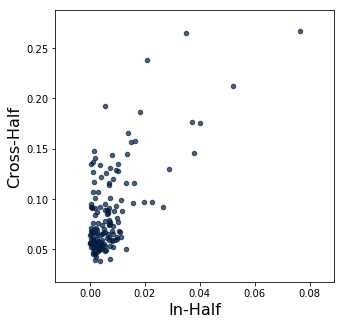

In [77]:
metadata_tb.scatter('In-Half', 'Cross-Half')

## Homework

Use our z-scores to rank the novels. Which novels are most "conversional"?

The novels that are the most controversial are The Man of Feeling and Vathek because they are the ones with the highest cross z-scores.

Piper includes only words that appeared in at least 60% of the book's sections. How might that shape his findings? What if he had used a 50% threshold?

This might shape his findings because some words that do not fit the 60% criteria, they will be disregarded even if they offer value to the findings. It is important to have a balance in order to use words that are important but still have a narrow focus.

Try changing the `min_df` argument to 0.5. How do the rankings change? Try eliminating the `min_df` altogether.

The rankings stay relatively the same, however, the two novels that had the largest values switched places in the rankings and, in the z-scores column, one of the values became positive instead of negative as they all were in the table where min_df was 0.6. When the min_df was eliminated, the rankings stay the same even though the values are different. 

## Bonus (not assigned)

Visualize distances among the twenty sections of the top-ranked conversional novel in the corpus using the MDS technique.